In [3]:
import numpy as np # linear algebra
import pandas as pd

In [4]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        

In [6]:
import pandas as pd
import numpy as np

from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio  

import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import warnings

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", 500)
pd.set_option('display.expand_frame_repr', False)  
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

pio.renderers.default = 'iframe'
pio.templates['ck_template'] = go.layout.Template(
    layout_colorway=px.colors.sequential.Viridis,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font=dict(family="Calibri Light"),
    layout_title_font=dict(family="Calibri"),
    layout_hoverlabel_font=dict(family="Calibri Light")
)

pio.templates.default = 'ck_template+gridon'

In [9]:
import pandas as pd

url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00601/ai4i2020.csv"
df = pd.read_csv(url)

In [10]:
df = pd.read_csv(url)
df.info(),df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                      10000 non-null  int64  
dtypes: float64(3), int64(9)

(None,
    UDI Product ID Type  Air temperature [K]  Process temperature [K]  Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  Machine failure  TWF  HDF  PWF  OSF  RNF
 0    1     M14860    M                298.1                    308.6                    1551         42.8                0                0    0    0    0    0    0
 1    2     L47181    L                298.2                    308.7                    1408         46.3                3                0    0    0    0    0    0
 2    3     L47182    L                298.1                    308.5                    1498         49.4                5                0    0    0    0    0    0
 3    4     L47183    L                298.2                    308.6                    1433         39.5                7                0    0    0    0    0    0
 4    5     L47184    L                298.2                    308.7                    1408         40.0                9                0    0    0    0    0   

In [11]:
for column in df.columns:
    try:
        df[column] = df[column].astype(float)
    except:
        pass
    
print(df.info(), df.head())  
df_numeric = df.select_dtypes(include=[np.number])
print(df_numeric.describe(include='all').T)   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  float64
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  float64
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  float64
 8   Machine failure          10000 non-null  float64
 9   TWF                      10000 non-null  float64
 10  HDF                      10000 non-null  float64
 11  PWF                      10000 non-null  float64
 12  OSF                      10000 non-null  float64
 13  RNF                      10000 non-null  float64
dtypes: float64(12), object(

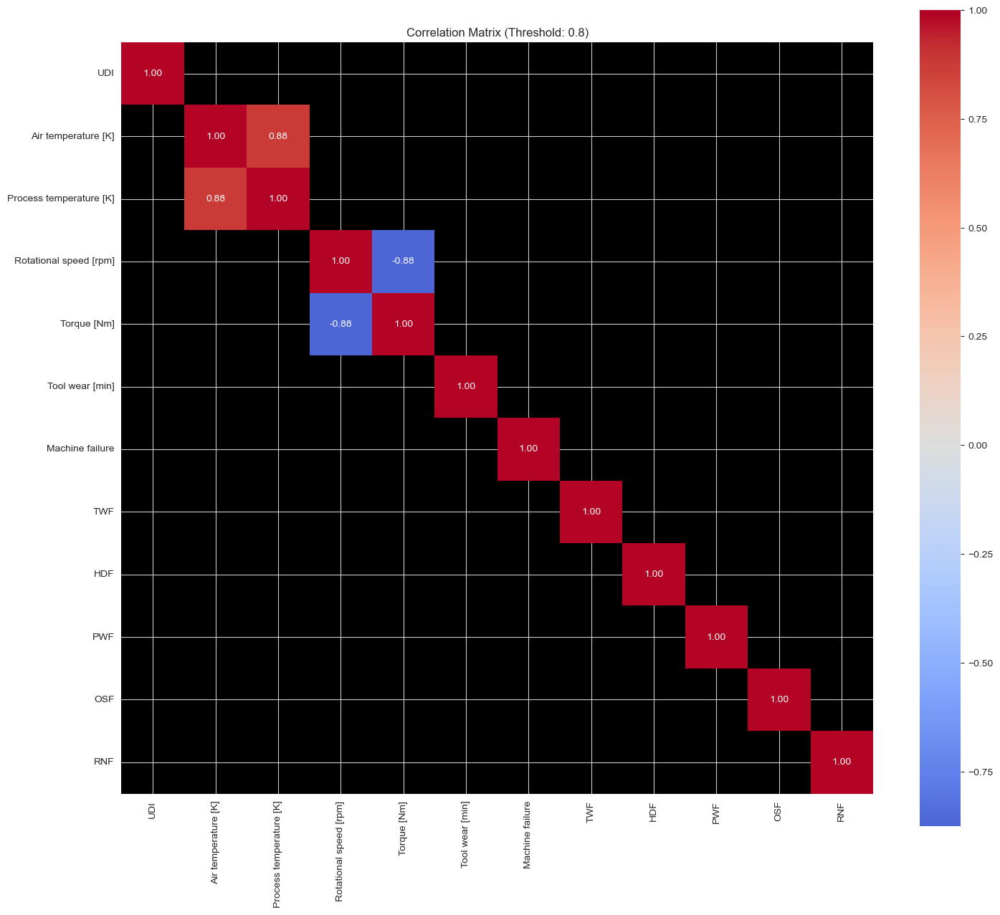

In [13]:
df_numeric = df.select_dtypes(include=['number'])

threshold = 0.8
sns.set_style('whitegrid', {'axes.facecolor': ".0"})
df_cluster2 = df_numeric.corr()  # Now this will work
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()

plt.figure(figsize=(15, 15))
sns.heatmap(df_cluster2, 
            mask=mask, 
            annot=True, 
            fmt=".2f", 
            cmap='coolwarm', 
            center=0,
            square=True,
            cbar_kws={"shrink": 0.8})
plt.title(f'Correlation Matrix (Threshold: {threshold})')
plt.tight_layout()
plt.show()

In [15]:
pip install ydata-profiling

   ---------------------------------------- 0.0/678.1 kB ? eta -:--:--
   --------------- ------------------------ 262.1/678.1 kB ? eta -:--:--
   ------------------------------ --------- 524.3/678.1 kB 1.3 MB/s eta 0:00:01
   ---------------------------------------- 678.1/678.1 kB 1.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/3.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/3.1 MB ? eta -:--:--
   ------ --------------------------------- 0.5/3.1 MB 1.3 MB/s eta 0:00:02
   ---------- ----------------------------- 0.8/3.1 MB 1.3 MB/s eta 0:00:02
   ------------- -------------------------- 1.0/3.1 MB 1.3 MB/s eta 0:00:02
   ---------------- ----------------------- 1.3/3.1 MB 1.3 MB/s eta 0:00:02
   -------------------- ------------------- 1.6/3.1 MB 1.3 MB/s eta 0:00:02
   ----------------------- ---------------- 1.8/3.1 MB 1.3 MB/s eta 0:00:01
   -------------------------- ------------- 2.1/3.1 MB 1.3 MB/s eta 0:00:01
   -----------------------

In [16]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df,
                        title="Predictive Maintenance",
                        dataset={"description": "This profiling report was generated for jiejie",
                                 "copyright_holder": "jiejie",
                                 "copyright_year": "2023"},
                        explorative=True
                        )
profile

C:\Users\ASUS\AppData\Local\Temp\ipykernel_41572\4001719924.py:1: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 399.90it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
df.drop(['UDI', 'Product ID'], axis=1, inplace=True)  # Delete variables that are not helpful to predict
print(df.head())

  Type  Air temperature [K]  Process temperature [K]  Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  Machine failure  TWF  HDF  PWF  OSF  RNF
0    M                298.1                    308.6                  1551.0         42.8              0.0              0.0  0.0  0.0  0.0  0.0  0.0
1    L                298.2                    308.7                  1408.0         46.3              3.0              0.0  0.0  0.0  0.0  0.0  0.0
2    L                298.1                    308.5                  1498.0         49.4              5.0              0.0  0.0  0.0  0.0  0.0  0.0
3    L                298.2                    308.6                  1433.0         39.5              7.0              0.0  0.0  0.0  0.0  0.0  0.0
4    L                298.2                    308.7                  1408.0         40.0              9.0              0.0  0.0  0.0  0.0  0.0  0.0


In [18]:
df['Machine failure'].value_counts()  #


Machine failure
0.0    9661
1.0     339
Name: count, dtype: int64

In [19]:
df['TWF'].value_counts()

TWF
0.0    9954
1.0      46
Name: count, dtype: int64

In [20]:
df['HDF'].value_counts()

HDF
0.0    9885
1.0     115
Name: count, dtype: int64

In [21]:
df['PWF'].value_counts()

PWF
0.0    9905
1.0      95
Name: count, dtype: int64

In [22]:
df['OSF'].value_counts()

OSF
0.0    9902
1.0      98
Name: count, dtype: int64

In [23]:
df['RNF'].value_counts()

RNF
0.0    9981
1.0      19
Name: count, dtype: int64

In [32]:
df.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,Tool_Risk,Operation_Mode
0,Medium,298.1,308.6,1551.0,42.8,0.0,0,Normal,NaN
1,Low,298.2,308.7,1408.0,46.3,3.0,0,Normal,High_Torque_Low_Speed
2,Low,298.1,308.5,1498.0,49.4,5.0,0,Normal,High_Torque_Low_Speed
3,Low,298.2,308.6,1433.0,39.5,7.0,0,Normal,NaN
4,Low,298.2,308.7,1408.0,40.0,9.0,0,Normal,NaN


In [38]:
# print("'Machine failure' column already exists. No need to recreate it.")
# print(f"Current 'Machine failure' distribution:")
# print(df['Machine failure'].value_counts().sort_index())
# df.head()

In [39]:
# print("Current state of 'Machine failure' column:")
# print(df['Machine failure'].value_counts().sort_index())
# print(f"\nData types: {df['Machine failure'].dtype}")

# # Check if it's already the multi-class version you wanted
# unique_values = df['Machine failure'].unique()
# print(f"\nUnique values in 'Machine failure': {sorted(unique_values)}")

# if set(unique_values) == {0, 1}:
#     print("⚠️ 'Machine failure' is binary (0/1), not multi-class")
# elif set(unique_values) == {0, 1, 2, 3, 4, 5}:
#     print("✅ 'Machine failure' is already multi-class (0-5)")
# else:
#     print(f"❓ 'Machine failure' has unexpected values: {unique_values}")

In [40]:
print("Current DataFrame Info:")
print(f"Shape: {df.shape}")
print(f"Columns: {df.columns.tolist()}")

print("\nTarget variable 'Machine failure' distribution:")
print(df['Machine failure'].value_counts())

print("\nSample of data:")
df.head()

Current DataFrame Info:
Shape: (10000, 9)
Columns: ['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Machine failure', 'Tool_Risk', 'Operation_Mode']

Target variable 'Machine failure' distribution:
Machine failure
0    10000
Name: count, dtype: int64

Sample of data:


,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,Tool_Risk,Operation_Mode
0,Medium,298.1,308.6,1551.0,42.8,0.0,0,Normal,NaN
1,Low,298.2,308.7,1408.0,46.3,3.0,0,Normal,High_Torque_Low_Speed
2,Low,298.1,308.5,1498.0,49.4,5.0,0,Normal,High_Torque_Low_Speed
3,Low,298.2,308.6,1433.0,39.5,7.0,0,Normal,NaN
4,Low,298.2,308.7,1408.0,40.0,9.0,0,Normal,NaN


In [41]:
print("DataFrame Info:")
print(df.info())
print(f"\nShape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nFirst 3 rows:")
print(df.head(3))

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Type                     10000 non-null  object 
 1   Air temperature [K]      10000 non-null  float64
 2   Process temperature [K]  10000 non-null  float64
 3   Rotational speed [rpm]   10000 non-null  float64
 4   Torque [Nm]              10000 non-null  float64
 5   Tool wear [min]          10000 non-null  float64
 6   Machine failure          10000 non-null  int64  
 7   Tool_Risk                10000 non-null  object 
 8   Operation_Mode           4340 non-null   object 
dtypes: float64(5), int64(1), object(3)
memory usage: 703.3+ KB
None

Shape: (10000, 9)

Columns: ['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Machine failure', 'Tool_Risk', 'Operation_Mode']

First 3 rows:
 

In [42]:
df['Power'] = df['Rotational speed [rpm]'] * df['Torque [Nm]']
df['Power wear'] = df['Power'] * df['Tool wear [min]']
df['Temperature difference'] = df['Process temperature [K]'] - df['Air temperature [K]']
df['Temperature power'] = df['Temperature difference'] / df['Power']
df = df[['Air temperature [K]',
         'Process temperature [K]',
         'Rotational speed [rpm]',
         'Torque [Nm]',
         'Tool wear [min]',
         'Power',
         'Power wear',
         'Temperature difference',
         'Temperature power',
         'Type',
         'Machine failure'
         ]]
print(list(df))

['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Power', 'Power wear', 'Temperature difference', 'Temperature power', 'Type', 'Machine failure']


In [43]:
df = pd.get_dummies(df, drop_first=True)

In [44]:
features = list(df.columns)  # Deal with special values and nan 

df.replace("?", np.nan, inplace=True)

df_numeric.fillna(df_numeric.mean(), inplace=True)
for feature in features:
    try:
        df[feature].filna(df[feature].mean(), inplace=True)
    except:
        try:
            df[feature].fillna(df[feature].mode(), inplace=True)
        except:
            pass
        
for feature in features:
    print(feature + "-" + str(
        len(df[df[feature].isna()])))  

Air temperature [K]-0
Process temperature [K]-0
Rotational speed [rpm]-0
Torque [Nm]-0
Tool wear [min]-0
Power-0
Power wear-0
Temperature difference-0
Temperature power-0
Machine failure-0
Type_Low-0
Type_Medium-0


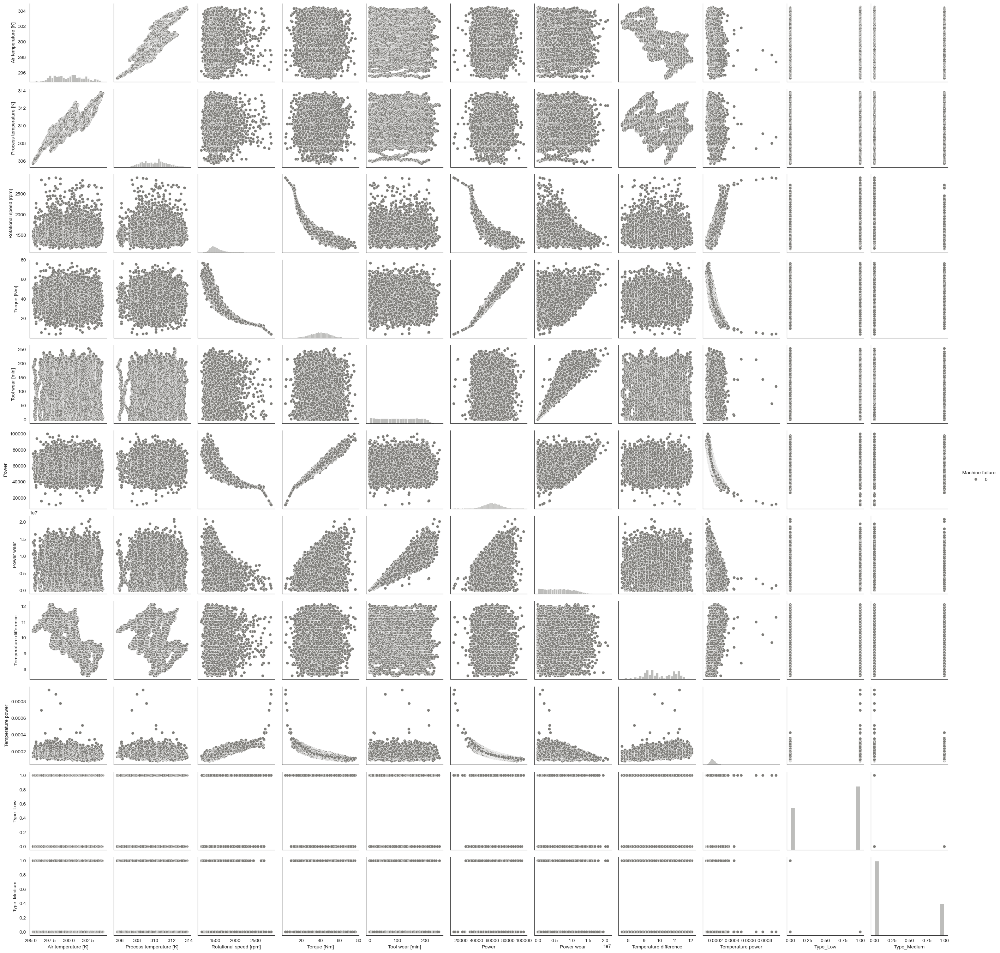

In [48]:
sns.set_style('white')
plot_kws = {"s": 1}
g = sns.pairplot(df,
                 diag_kind='hist',
                 corner=False,
                 palette='cividis',
                 hue='Machine failure')  
plt.show()  

            PC1           PC2         PC3        PC4       PC5       PC6       PC7       PC8       PC9      PC10          PC11          PC12  Machine failure
0 -6.471436e+06  10853.077800  102.587443   8.335594 -2.410653 -1.900780 -0.203172 -0.908322  0.113953  0.000870  5.117533e-07 -4.458163e-14                0
1 -6.275866e+06   9528.701918  -57.314870   5.972044 -2.187217  0.540605 -0.097415  0.519973  0.053618  0.000808 -3.037831e-06  2.652095e-13                0
2 -6.101425e+06  18217.697872  157.501577  20.681295 -2.464843 -1.832123 -0.338287  0.512986  0.051957  0.000841  3.783530e-06 -3.302598e-13                0
3 -6.075218e+06    804.708009 -153.900183  -8.354761 -2.173172  0.629990 -0.235759  0.512110  0.056853  0.000761  7.192457e-07 -6.276157e-14                0
4 -5.964563e+06    445.701393 -182.911094  -8.664705 -2.129598  0.999449 -0.088474  0.514537  0.056899  0.000790  7.467042e-07 -6.515872e-14                0
5 -5.814658e+06   3729.809835 -117.922477  -3.132981

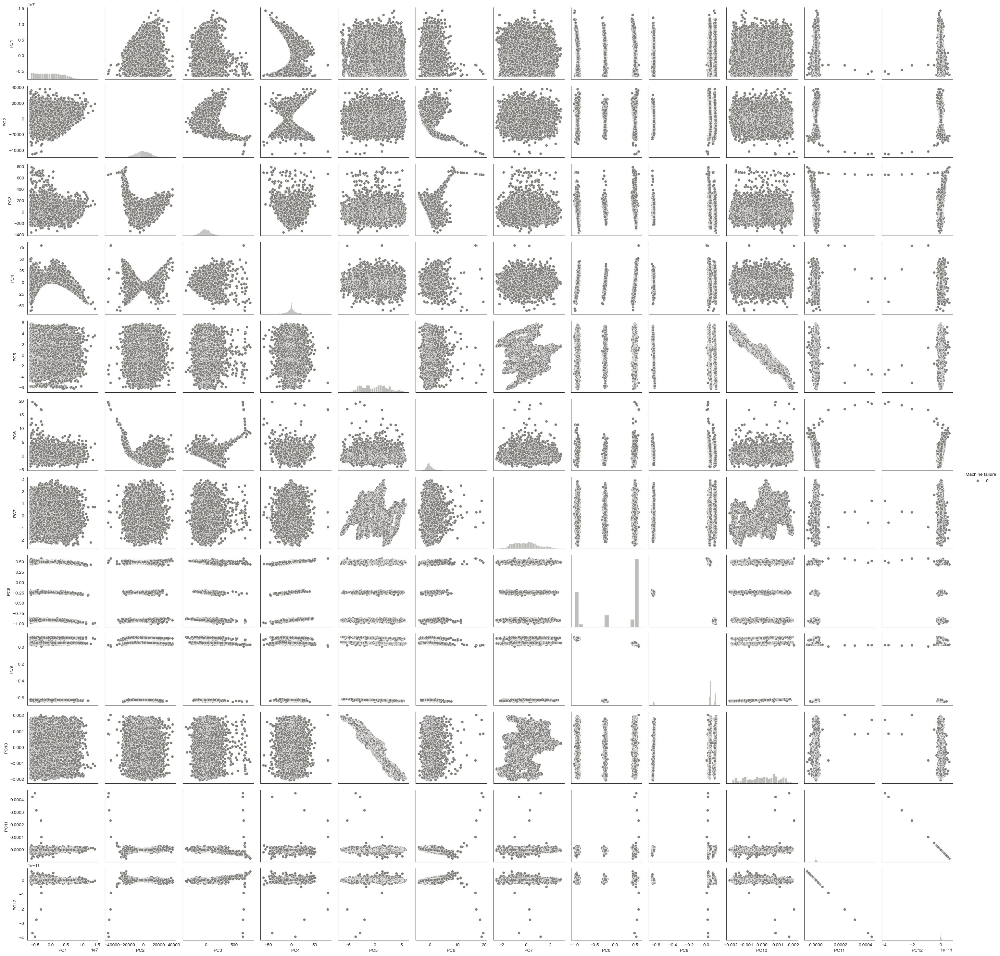

In [52]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA
pca=PCA()
X_pca=pca.fit_transform(df)  
component_names=[f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca=pd.DataFrame(X_pca,columns=component_names)
X_pca['Machine failure']=df["Machine failure"]
print(X_pca.head(10))

sns.set_style('white')
plot_kws={"s":1}
g=sns.pairplot(X_pca,diag_kind='hist',corner=False,palette='cividis',hue='Machine failure')
plt.show() 

In [56]:
from random import sample
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import scale, normalize

X = df.iloc[:, :-1]
y = df.iloc[:, -1]

def hopkins_statistic(X, k=2):
    try:
        X = X.values 
    except:
        pass
    X = normalize(X)

    sample_size = int(X.shape[0] * 0.05) 

    X_uniform_random_sample = uniform(X.min(axis=0), X.max(axis=0),
                                      (sample_size, X.shape[1]))  

    random_indices = sample(range(0, X.shape[0], 1), k=sample_size)
    X_sample = X[random_indices] 

    neigh = NearestNeighbors(n_neighbors=k)  
    nbrs = neigh.fit(X) 

    u_distances, u_indices = nbrs.kneighbors(X_uniform_random_sample, n_neighbors=k)  
    u_distances = u_distances[:, 0]  

    w_distances, w_indices = nbrs.kneighbors(X_sample, n_neighbors=k)  
    w_distances = w_distances[:, 1]  

    u_sum = np.sum(u_distances)
    w_sum = np.sum(w_distances)

    H = u_sum / (u_sum + w_sum)
    return H


H = hopkins_statistic(X, 3)
print('Hopkins statistic:' + str(H)) 

Hopkins statistic:0.9999478759290762


In [57]:
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

# Obtain training data set and testing data set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Normalization to avoid skewed data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [65]:
# Check your current data
print("X info:")
print(f"Shape: {X.shape}")
print(f"Data types:\n{X.dtypes}")

print("\ny info:")
print(f"Type: {type(y)}")
if hasattr(y, 'dtype'):
    print(f"Dtype: {y.dtype}")
print(f"Sample values: {y[:5] if hasattr(y, '__getitem__') else 'N/A'}")

# Check for specific problematic columns
print("\nChecking for non-numeric data:")
for col in X.columns:
    if X[col].dtype == 'object':
        print(f"Column '{col}': {X[col].unique()[:10]}")  # First 10 unique values

X info:
Shape: (10000, 11)
Data types:
Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]     float64
Torque [Nm]                float64
Tool wear [min]            float64
Power                      float64
Power wear                 float64
Temperature difference     float64
Temperature power          float64
Machine failure              int64
Type_Low                      bool
dtype: object

y info:
Type: <class 'pandas.core.series.Series'>
Dtype: bool
Sample values: 0     True
1    False
2    False
3    False
4    False
Name: Type_Medium, dtype: bool

Checking for non-numeric data:


In [64]:
# from sklearn.feature_selection import RFE
# from sklearn.linear_model import LinearRegression
# from sklearn.preprocessing import StandardScaler

# def sklearn_backward_selection(X, y, n_features_to_select=None):
    
#     # Prepare data
#     X_clean = X.select_dtypes(include=[np.number])
#     if X_clean.empty:
#         # If no numeric columns, convert all to numeric
#         X_clean = X.apply(pd.to_numeric, errors='coerce')
#         X_clean = X_clean.dropna(axis=1, how='all')
    
#     # Drop rows with NaN
#     valid_mask = ~X_clean.isna().any(axis=1)
#     X_final = X_clean[valid_mask]
#     y_final = y[valid_mask]
    
#     # Scale features
#     scaler = StandardScaler()
#     X_scaled = scaler.fit_transform(X_final)
    
#     # Determine number of features to select
#     if n_features_to_select is None:
#         n_features_to_select = max(1, X_final.shape[1] // 2)
    
#     # Perform RFE
#     estimator = LinearRegression()
#     selector = RFE(estimator, n_features_to_select=n_features_to_select, step=1)
#     selector = selector.fit(X_scaled, y_final)
    
#     # Get selected features
#     selected_mask = selector.support_
#     selected_features = X_final.columns[selected_mask].tolist()
    
#     print(f"✅ Selected {len(selected_features)} features:")
#     print(selected_features)
    
#     return selected_features

# # Use scikit-learn approach
# selected_features_sklearn = sklearn_backward_selection(X, y)

In [63]:

# def prepare_data_for_regression(X, y):
   
#     X_clean = X.copy()
#     y_clean = y.copy()
    
#     # Convert y to numeric
#     if y_clean.dtype == 'object':
#         y_clean = pd.to_numeric(y_clean, errors='coerce')
    
#     # Convert X to numeric, handling categorical variables
#     for col in X_clean.columns:
#         if X_clean[col].dtype == 'object':
#             # Try to convert to numeric first
#             X_clean[col] = pd.to_numeric(X_clean[col], errors='ignore')
            
#             # If still object, use one-hot encoding
#             if X_clean[col].dtype == 'object':
#                 dummies = pd.get_dummies(X_clean[col], prefix=col, drop_first=True)
#                 X_clean = pd.concat([X_clean.drop(col, axis=1), dummies], axis=1)
    
#     # Remove any remaining non-numeric columns
#     X_clean = X_clean.select_dtypes(include=[np.number])
    
#     # Drop rows with NaN values
#     valid_mask = ~(X_clean.isna().any(axis=1) | y_clean.isna())
#     X_final = X_clean[valid_mask]
#     y_final = y_clean[valid_mask]
    
#     print(f"Original shape: {X.shape}, Cleaned shape: {X_final.shape}")
#     print(f"Dropped {len(X) - len(X_final)} rows due to NaN/invalid values")
    
#     return X_final, y_final

# def backward_regression(X, y, initial_list=[], threshold_out=0.05, verbose=True):
    
    
#     X_clean, y_clean = prepare_data_for_regression(X, y)
    
#     included = list(X_clean.columns)
#     selected_features = []
    
#     while True:
#         changed = False
#         # Add constant and fit model
#         X_with_const = sm.add_constant(X_clean[included])
#         model = sm.OLS(y_clean, X_with_const).fit()
        
#         # Get p-values (excluding intercept)
#         pvalues = model.pvalues.iloc[1:]
        
#         if len(pvalues) == 0:
#             break
            
#         worst_pval = pvalues.max()
#         if worst_pval > threshold_out:
#             changed = True
#             worst_feature = pvalues.idxmax()
#             included.remove(worst_feature)
#             if verbose:
#                 print(f"Drop: {worst_feature}, p-value: {worst_pval:.4f}")
        
#         if not changed:
#             break
    
#     selected_features = included
#     print(f"\n Selected {len(selected_features)} features:")
#     print(selected_features)
    
#     return selected_features

# # Run the analysis
# selected_features = backward_regression(X, y)

# # Create subset with selected features
# X_selected = X[selected_features]
# print(f"\nFinal dataset shape: {X_selected.shape}")
# X_selected.head()

Accuracy: 87.80% 
Recall: 85.98% 
Precision: 76.30% 
F1-Score: 80.85% 
MCC: 72.22% 
time to train: 0.04 s 
time to predict: 0.05 s 
total: 0.10 s


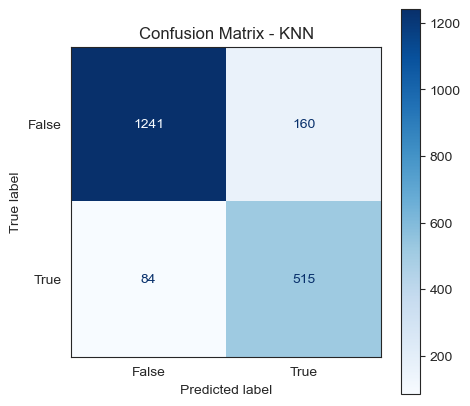

In [72]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, roc_auc_score, matthews_corrcoef
from sklearn.metrics import ConfusionMatrixDisplay  # Fixed import
import time
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

model_performance = pd.DataFrame(columns=['Accuracy', 'Recall', 'Precision', 'F1-Score', 'MCC score',
                                          'time to train', 'time to predict', 'total time'])

# KNN model
start = time.time()
model = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

# Fixed metrics calculation - removed 'weighted' for binary classification
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)  # Removed average='weighted'
precision = precision_score(y_test, y_pred)  # Removed average='weighted'
f1s = f1_score(y_test, y_pred)  # Fixed: removed incorrect parameter
MCC = matthews_corrcoef(y_test, y_pred)

print("Accuracy: " + "{:.2%}".format(accuracy),
      "\nRecall: " + "{:.2%}".format(recall),
      "\nPrecision: " + "{:.2%}".format(precision),  # Fixed typo: "Precison" → "Precision"
      "\nF1-Score: " + "{:.2%}".format(f1s),
      "\nMCC: " + "{:.2%}".format(MCC),
      "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
      "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
      "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
      )

# Fixed: Changed 'Logistic' to 'KNN' since this is KNN model
model_performance.loc['KNN'] = [accuracy, recall, precision, f1s, MCC, end_train - start, end_predict - end_train,
                                end_predict - start]

# Plot confusion matrix using modern method
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['font.size'] = 10
sns.set_style('white')

# Fixed: Replaced deprecated plot_confusion_matrix with ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Confusion Matrix - KNN')
plt.show()

Accuracy: 87.80% 
Recall: 87.80% 
Precision: 88.46% 
F1-Score: 87.99% 
MCC: 72.22% 
time to train: 0.01 s 
time to predict: 0.04 s 
total: 0.05 s


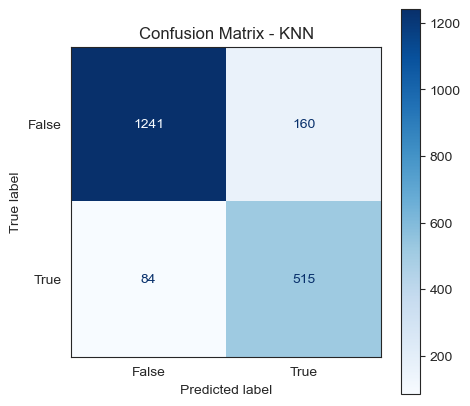

In [73]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, roc_auc_score, matthews_corrcoef
from sklearn.metrics import ConfusionMatrixDisplay
import time
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

model_performance = pd.DataFrame(columns=['Accuracy', 'Recall', 'Precision', 'F1-Score', 'MCC score',
                                          'time to train', 'time to predict', 'total time'])

# KNN model
start = time.time()
model = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()


accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')  # Keep weighted for multi-class
precision = precision_score(y_test, y_pred, average='weighted')  # Keep weighted for multi-class
f1s = f1_score(y_test, y_pred, average='weighted')  # Added average for multi-class
MCC = matthews_corrcoef(y_test, y_pred)

print("Accuracy: " + "{:.2%}".format(accuracy),
      "\nRecall: " + "{:.2%}".format(recall),
      "\nPrecision: " + "{:.2%}".format(precision),
      "\nF1-Score: " + "{:.2%}".format(f1s),
      "\nMCC: " + "{:.2%}".format(MCC),
      "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
      "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
      "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
      )

model_performance.loc['KNN'] = [accuracy, recall, precision, f1s, MCC, end_train - start, end_predict - end_train,
                                end_predict - start]

# Plot confusion matrix
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['font.size'] = 10
sns.set_style('white')

ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Confusion Matrix - KNN')
plt.show()

In [76]:
print("Diagnostic Information:")
print(f"X_train type: {type(X_train)}")
print(f"X_train shape: {X_train.shape}")

if hasattr(X_train, 'columns'):
    print(f"X_train columns: {X_train.columns.tolist()}")
else:
    print("X_train has no columns attribute")

print(f"model.feature_importances_ shape: {model.feature_importances_.shape}")
print(f"model.feature_importances_: {model.feature_importances_}")

# Check if feature_names exists
if 'feature_names' in locals():
    print(f"feature_names: {feature_names}")
else:
    print("feature_names not defined")

Diagnostic Information:
X_train type: <class 'numpy.ndarray'>
X_train shape: (8000, 11)
X_train has no columns attribute
model.feature_importances_ shape: (11,)
model.feature_importances_: [0.02829383 0.03562247 0.04819217 0.03799003 0.03802844 0.04037862
 0.05145253 0.0254367  0.05251309 0.         0.64209211]
feature_names not defined


Decision Tree Performance:
Accuracy:  84.45%
Recall:    84.45%
Precision: 84.21%
F1-Score:  84.30%
MCC:       62.31%
Time to train:    0.03 s
Time to predict:  0.00 s
Total time:       0.03 s


<Figure size 500x500 with 0 Axes>

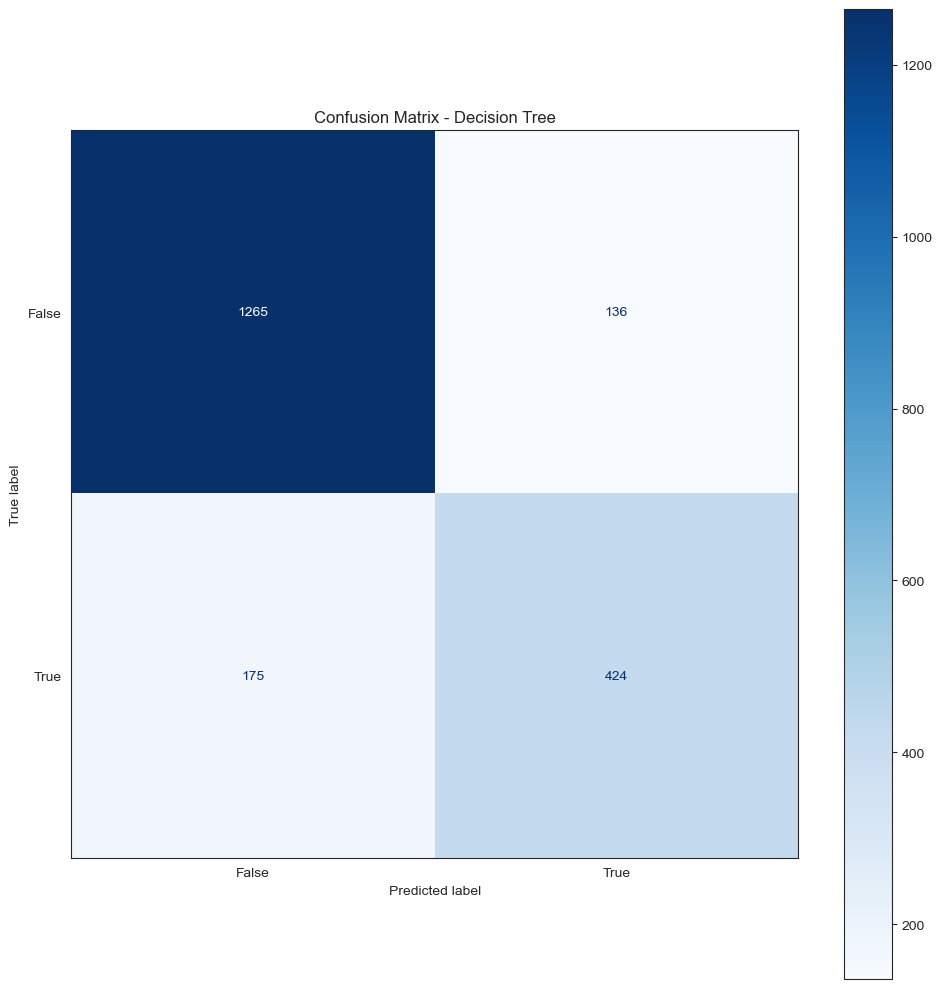

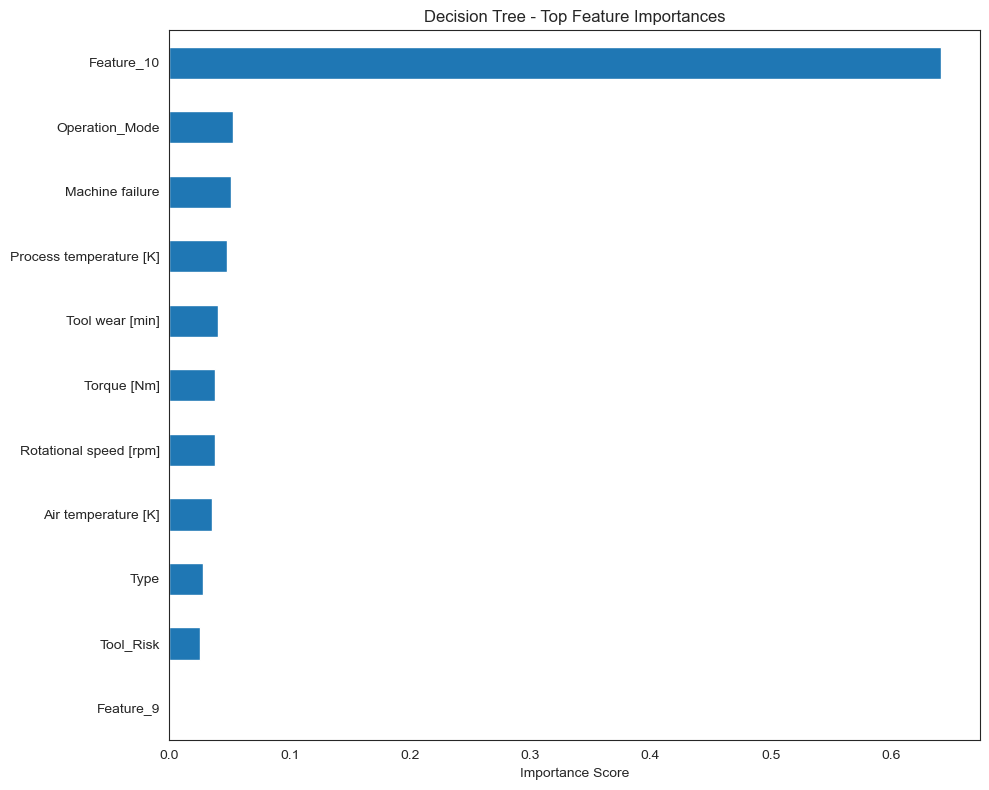


Feature Importances:
  Feature_10: 0.6421
  Operation_Mode: 0.0525
  Machine failure: 0.0515
  Process temperature [K]: 0.0482
  Tool wear [min]: 0.0404
  Torque [Nm]: 0.0380
  Rotational speed [rpm]: 0.0380
  Air temperature [K]: 0.0356
  Type: 0.0283
  Tool_Risk: 0.0254
  Feature_9: 0.0000


In [78]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Decision Tree model
start = time.time()
model = DecisionTreeClassifier(random_state=42).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average='weighted')
MCC = matthews_corrcoef(y_test, y_pred)

print("Decision Tree Performance:")
print(f"Accuracy:  {accuracy:.2%}")
print(f"Recall:    {recall:.2%}")
print(f"Precision: {precision:.2%}")
print(f"F1-Score:  {f1s:.2%}")
print(f"MCC:       {MCC:.2%}")
print(f"Time to train:    {end_train - start:.2f} s")
print(f"Time to predict:  {end_predict - end_train:.2f} s")
print(f"Total time:       {end_predict - start:.2f} s")

# Store results
model_performance.loc['Decision Tree'] = [accuracy, recall, precision, f1s, MCC, 
                                          end_train - start, end_predict - end_train, 
                                          end_predict - start]

# Confusion Matrix
plt.figure(figsize=(5, 5))
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Decision Tree')
plt.tight_layout()
plt.show()

# Feature Importance - FIXED FOR NUMPY ARRAYS
plt.figure(figsize=(10, 8))

# Create meaningful feature names based on your predictive maintenance dataset
feature_names = [
    'Type', 'Air temperature [K]', 'Process temperature [K]', 
    'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]',
    'Machine failure', 'Tool_Risk', 'Operation_Mode', 'Feature_9', 'Feature_10'
]

# If you have different features, adjust the names accordingly
# Alternatively, use generic names
if len(feature_names) != len(model.feature_importances_):
    feature_names = [f'Feature_{i}' for i in range(len(model.feature_importances_))]

# Create and plot feature importances
feat_importances = pd.Series(model.feature_importances_, index=feature_names)
top_features = feat_importances.nlargest(20)

# Plot
top_features.plot(kind='barh')
plt.title('Decision Tree - Top Feature Importances')
plt.xlabel('Importance Score')
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.show()

# Print the feature importances
print("\nFeature Importances:")
for feature, importance in top_features.items():
    print(f"  {feature}: {importance:.4f}")

In [79]:
# # Simple version with generic names
# plt.figure(figsize=(10, 8))
# feature_names = [f'Feature_{i}' for i in range(X_train.shape[1])]
# feat_importances = pd.Series(model.feature_importances_, index=feature_names)
# top_features = feat_importances.nlargest(20)

# top_features.plot(kind='barh')
# plt.title(f'Decision Tree - Feature Importances (Most important: {top_features.index[0]})')
# plt.xlabel('Importance Score')
# plt.gca().invert_yaxis()
# plt.tight_layout()
# plt.show()

# print("Most important features:")
# for i, (feature, importance) in enumerate(top_features.items(), 1):
#     print(f"{i:2d}. {feature}: {importance:.4f}")

Random Forest Performance:
Accuracy:  89.15%
Recall:    89.15%
Precision: 91.22%
F1-Score:  89.48%
MCC:       77.59%
Time to train:    0.21 s
Time to predict:  0.03 s
Total time:       0.24 s


<Figure size 500x500 with 0 Axes>

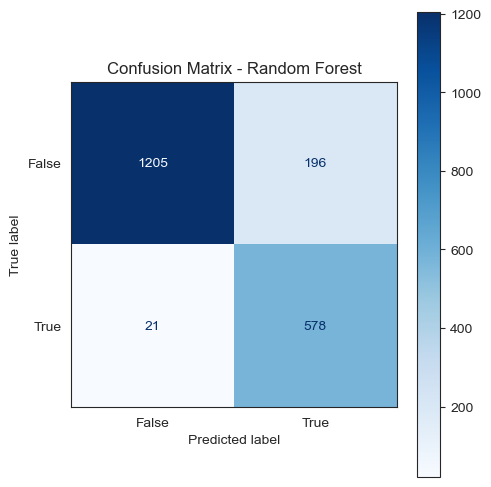

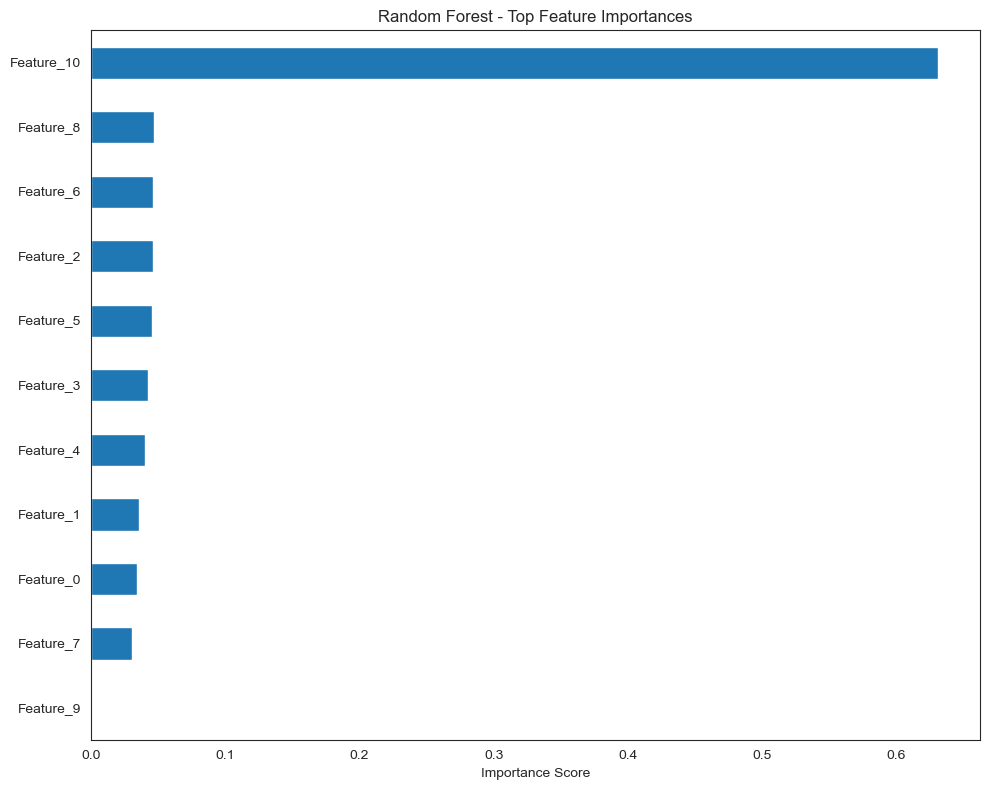


Random Forest Feature Importances:
  Feature_10: 0.6307
  Feature_8: 0.0469
  Feature_6: 0.0465
  Feature_2: 0.0464
  Feature_5: 0.0459
  Feature_3: 0.0426
  Feature_4: 0.0403
  Feature_1: 0.0356
  Feature_0: 0.0346
  Feature_7: 0.0305
  Feature_9: 0.0000


In [81]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import ConfusionMatrixDisplay
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Random Forest model
start = time.time()
model = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=0, bootstrap=True).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average='weighted')  # Fixed: added average parameter
MCC = matthews_corrcoef(y_test, y_pred)

print("Random Forest Performance:")
print(f"Accuracy:  {accuracy:.2%}")
print(f"Recall:    {recall:.2%}")
print(f"Precision: {precision:.2%}")
print(f"F1-Score:  {f1s:.2%}")
print(f"MCC:       {MCC:.2%}")
print(f"Time to train:    {end_train - start:.2f} s")
print(f"Time to predict:  {end_predict - end_train:.2f} s")
print(f"Total time:       {end_predict - start:.2f} s")

# Store results
model_performance.loc['Random Forest'] = [accuracy, recall, precision, f1s, MCC, 
                                          end_train - start, end_predict - end_train, 
                                          end_predict - start]

# Confusion Matrix
plt.figure(figsize=(5, 5))
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Random Forest')
plt.tight_layout()
plt.show()

# Feature Importance for Random Forest
plt.figure(figsize=(10, 8))

# Create feature names (since X_train is numpy array)
feature_names = [f'Feature_{i}' for i in range(X_train.shape[1])]

# Create and plot feature importances
feat_importances = pd.Series(model.feature_importances_, index=feature_names)
top_features = feat_importances.nlargest(20)

# Plot
top_features.plot(kind='barh')
plt.title('Random Forest - Top Feature Importances')
plt.xlabel('Importance Score')
plt.gca().invert_yaxis()  # Most important at top
plt.tight_layout()
plt.show()

# Print the feature importances
print("\nRandom Forest Feature Importances:")
for feature, importance in top_features.items():
    print(f"  {feature}: {importance:.4f}")

Accuracy: 89.85% 
Recall: 89.85% 
Precision: 92.34% 
F1-Score: 90.18% 
MCC: 79.80% 
time to train: 1.28 s 
time to predict: 0.00 s 
total: 1.28 s


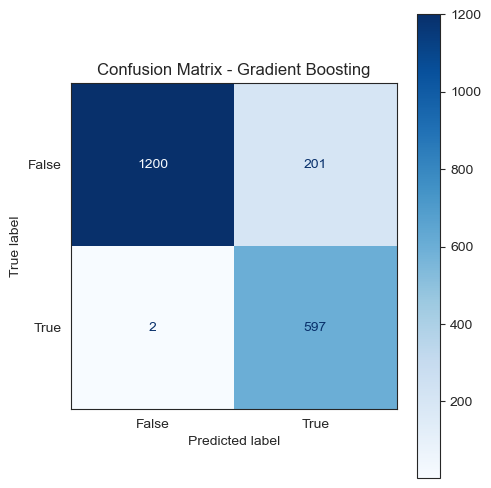

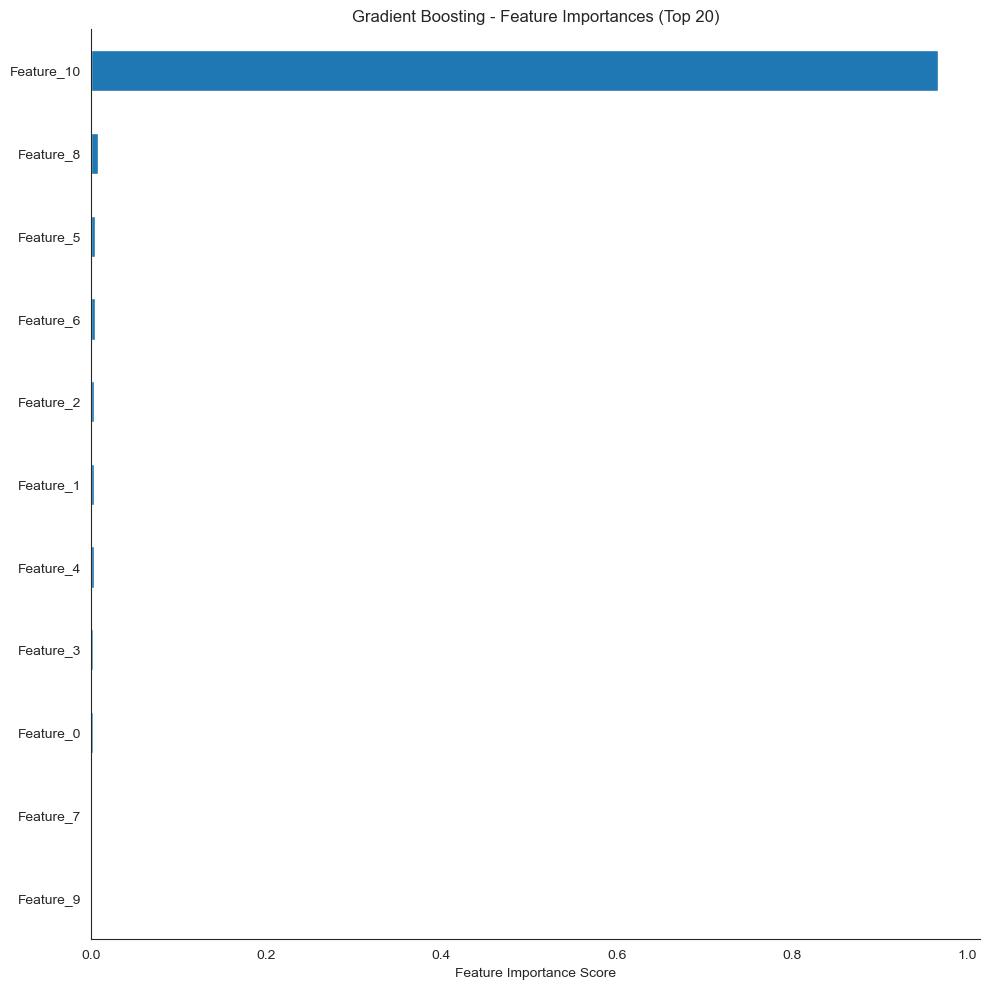

In [84]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import ConfusionMatrixDisplay  # Add this import

start = time.time()
model = GradientBoostingClassifier(random_state=42).fit(X_train, y_train)  # Added random_state
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

# Fixed: Added average parameter to f1_score
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average='weighted')  # Fixed: added average parameter
MCC = matthews_corrcoef(y_test, y_pred)

print("Accuracy: " + "{:.2%}".format(accuracy),
      "\nRecall: " + "{:.2%}".format(recall),
      "\nPrecision: " + "{:.2%}".format(precision),  # Fixed typo: "Precison" → "Precision"
      "\nF1-Score: " + "{:.2%}".format(f1s),
      "\nMCC: " + "{:.2%}".format(MCC),
      "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
      "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
      "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
      )
model_performance.loc['Gradient Boosting'] = [accuracy, recall, precision, f1s, MCC, end_train - start,
                                              end_predict - end_train, end_predict - start]

# Fixed: Replaced plot_confusion_matrix with ConfusionMatrixDisplay
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['font.size'] = 10
sns.set_style('white')
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Gradient Boosting')
plt.tight_layout()
plt.show()

# Feature Importance - FIXED (removed groupby line)
plt.rcParams['figure.figsize'] = (10, 10)
sns.set_style('white')

# Create feature names (since X_train is numpy array)
feature_names = [f'Feature_{i}' for i in range(X_train.shape[1])]

feat_importances = pd.Series(model.feature_importances_, index=feature_names)
# feat_importances = feat_importances.groupby(level=0).mean()  # REMOVED - not needed for simple indexes

feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
plt.title('Gradient Boosting - Feature Importances (Top 20)')
plt.xlabel('Feature Importance Score')
sns.despine()
plt.tight_layout()
plt.show()